In [1]:
import gensim
import os
from distutils.version import LooseVersion, StrictVersion
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import sklearn.neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
import re

In [2]:
from gensim.models import Word2Vec

In [3]:
modelwv = Word2Vec.load("W2Vmodel.bin")

In [4]:
print(modelwv.wv['việt_nam'])

[ 6.26405001e-01  1.74230742e+00  3.39452446e-01  1.61769605e+00
  1.24599099e+00 -2.02257950e-02  5.18159628e-01  1.30082703e+00
 -2.85692406e+00 -3.14036727e+00  2.32057047e+00  3.97005647e-01
 -9.05862093e-01 -3.42936611e+00 -1.82856247e-01 -6.39763594e-01
 -1.15834877e-01  2.95627415e-01 -2.05692124e+00 -2.60721350e+00
  5.18661976e-01  9.42185879e-01  1.13166952e+00  7.10537955e-02
 -8.10626328e-01  7.83423986e-03 -9.31980275e-03  1.07196820e+00
  4.08221900e-01  8.40779722e-01 -1.13034034e+00  4.34210688e-01
  1.75909960e+00 -7.35302746e-01  4.71670330e-01 -3.96348417e-01
 -2.99143600e+00  5.01955152e-01  1.88820612e+00  3.34713534e-02
 -1.44530201e+00 -7.11900771e-01  1.67841315e-01  1.07969336e-01
 -1.47908533e+00  1.09683120e+00  6.96572736e-02  1.01172078e+00
 -1.86869586e+00 -6.56652749e-01  2.12696418e-01  6.86233938e-01
  2.24882865e+00 -8.96076500e-01  6.48067236e-01 -6.34592056e-01
 -4.80282992e-01  8.45142186e-01 -4.42703635e-01 -8.92698944e-01
 -1.40377712e+00  2.96891

In [5]:
modelwv.wv.most_similar('việt_nam', topn=5)

[('hàn_quốc', 0.5629851222038269),
 ('campuchia', 0.5471175909042358),
 ('việt', 0.5427928566932678),
 ('singapore', 0.491588294506073),
 ('asean', 0.49015307426452637)]

In [6]:
len(modelwv.wv)

137183

In [7]:
data = pd.read_csv('data_after.csv')

In [8]:
data.head()

,Unnamed: 0,text,lable,word_length
0,0,cháy căn_hộ nhà_tầng sài_gòn lửa cháy dữ_dội c...,Chinhtrixahoi,179
1,1,chủ xe cá_nhân có_thể xác_nhận điện_tử giãn ch...,Chinhtrixahoi,283
2,2,xây bãi xe_ngầm tầng sân golf trung_tâm đà lạt...,Chinhtrixahoi,207
3,3,bộ_đội việt_nam phát_hiện vị_trí dấu_hiệu sống...,Chinhtrixahoi,260
4,4,đường võ chí công hoàn_thành xe_khách chạy quả...,Chinhtrixahoi,527


In [9]:
def FunctionText2Vec(inpTextData):
    W2Vec_Data=pd.DataFrame()
    for i in inpTextData:
        Sentence = np.zeros(300)
        WordsVocab=str(i).split()
        for word in WordsVocab:
            try:
                Sentence=Sentence+modelwv.wv[word]
            except:
                Sentence=Sentence+np.zeros(300)
        Sentence=Sentence/len(WordsVocab)
        W2Vec_Data=W2Vec_Data.append(pd.DataFrame([Sentence]))     
    return(W2Vec_Data)

In [10]:
W2Vec_Data=FunctionText2Vec(data['text'])

C:\Users\trghuey\AppData\Local\Temp\ipykernel_16796\1994619382.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  W2Vec_Data=W2Vec_Data.append(pd.DataFrame([Sentence]))
C:\Users\trghuey\AppData\Local\Temp\ipykernel_16796\1994619382.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  W2Vec_Data=W2Vec_Data.append(pd.DataFrame([Sentence]))
C:\Users\trghuey\AppData\Local\Temp\ipykernel_16796\1994619382.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  W2Vec_Data=W2Vec_Data.append(pd.DataFrame([Sentence]))
C:\Users\trghuey\AppData\Local\Temp\ipykernel_16796\1994619382.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  W2Vec_Data=W2Ve

In [11]:
W2Vec_Data.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,0.186630,-0.382426,0.044915,0.289727,0.290481,0.413120,-0.272208,0.475098,0.088458,-0.067634,...,-0.281444,-0.006335,-0.087932,0.110266,0.434369,-0.307464,-0.007962,-0.205317,-0.253536,0.450228
0,0.296765,0.387401,0.422492,0.366082,-0.446615,-0.181468,0.036706,0.130209,-0.750518,-0.229176,...,0.390884,-0.209157,-0.201656,-0.324116,-0.278974,-1.236337,0.174702,-0.283314,-0.159311,0.207921
0,-0.093520,-0.459153,0.047005,0.439171,0.113796,0.009586,0.081305,0.305319,-0.493096,-0.497581,...,0.004582,-0.187398,0.040158,-0.005109,0.347790,-0.556414,0.089061,-0.428526,-0.142083,0.282212
0,0.348395,-0.224286,0.053795,0.382158,0.456125,0.458757,0.049642,0.086178,-0.136958,-0.119434,...,0.109786,0.084908,0.561298,-0.027059,0.366927,-0.463824,0.036183,-0.296007,-0.027590,-0.026149
0,0.102298,-0.423745,0.433664,0.387449,0.224186,0.358938,-0.037389,0.035028,-0.467923,-0.163817,...,0.051363,0.006579,0.121605,0.128695,-0.126338,-0.975548,-0.133363,-0.149140,-0.080499,0.017068


In [12]:
W2Vec_Data.shape

(44610, 300)

In [13]:
len(data)

44610

In [14]:
W2Vec_Data.reset_index(inplace=True, drop=True)
W2Vec_Data['lable']=data['lable']
W2Vec_Data['index']=data['Unnamed: 0']

In [15]:
W2Vec_Data.head()

,0,1,2,3,4,5,6,7,8,9,...,292,293,294,295,296,297,298,299,lable,index
0,0.186630,-0.382426,0.044915,0.289727,0.290481,0.413120,-0.272208,0.475098,0.088458,-0.067634,...,-0.087932,0.110266,0.434369,-0.307464,-0.007962,-0.205317,-0.253536,0.450228,Chinhtrixahoi,0
1,0.296765,0.387401,0.422492,0.366082,-0.446615,-0.181468,0.036706,0.130209,-0.750518,-0.229176,...,-0.201656,-0.324116,-0.278974,-1.236337,0.174702,-0.283314,-0.159311,0.207921,Chinhtrixahoi,1
2,-0.093520,-0.459153,0.047005,0.439171,0.113796,0.009586,0.081305,0.305319,-0.493096,-0.497581,...,0.040158,-0.005109,0.347790,-0.556414,0.089061,-0.428526,-0.142083,0.282212,Chinhtrixahoi,2
3,0.348395,-0.224286,0.053795,0.382158,0.456125,0.458757,0.049642,0.086178,-0.136958,-0.119434,...,0.561298,-0.027059,0.366927,-0.463824,0.036183,-0.296007,-0.027590,-0.026149,Chinhtrixahoi,3
4,0.102298,-0.423745,0.433664,0.387449,0.224186,0.358938,-0.037389,0.035028,-0.467923,-0.163817,...,0.121605,0.128695,-0.126338,-0.975548,-0.133363,-0.149140,-0.080499,0.017068,Chinhtrixahoi,4


In [16]:
W2Vec_Data.isna().sum()

0        0
1        0
2        0
3        0
4        0
        ..
297      0
298      0
299      0
lable    0
index    0
Length: 302, dtype: int64

In [17]:
DataForML=W2Vec_Data
DataForML.head()

,0,1,2,3,4,5,6,7,8,9,...,292,293,294,295,296,297,298,299,lable,index
0,0.186630,-0.382426,0.044915,0.289727,0.290481,0.413120,-0.272208,0.475098,0.088458,-0.067634,...,-0.087932,0.110266,0.434369,-0.307464,-0.007962,-0.205317,-0.253536,0.450228,Chinhtrixahoi,0
1,0.296765,0.387401,0.422492,0.366082,-0.446615,-0.181468,0.036706,0.130209,-0.750518,-0.229176,...,-0.201656,-0.324116,-0.278974,-1.236337,0.174702,-0.283314,-0.159311,0.207921,Chinhtrixahoi,1
2,-0.093520,-0.459153,0.047005,0.439171,0.113796,0.009586,0.081305,0.305319,-0.493096,-0.497581,...,0.040158,-0.005109,0.347790,-0.556414,0.089061,-0.428526,-0.142083,0.282212,Chinhtrixahoi,2
3,0.348395,-0.224286,0.053795,0.382158,0.456125,0.458757,0.049642,0.086178,-0.136958,-0.119434,...,0.561298,-0.027059,0.366927,-0.463824,0.036183,-0.296007,-0.027590,-0.026149,Chinhtrixahoi,3
4,0.102298,-0.423745,0.433664,0.387449,0.224186,0.358938,-0.037389,0.035028,-0.467923,-0.163817,...,0.121605,0.128695,-0.126338,-0.975548,-0.133363,-0.149140,-0.080499,0.017068,Chinhtrixahoi,4


In [18]:
TargetVariable=DataForML.columns[-2:]
Predictors=DataForML.columns[:-2]
 
X=DataForML[Predictors].values
y=DataForML[TargetVariable].values

In [19]:
from sklearn.preprocessing import MinMaxScaler

In [20]:
PredictorScaler=MinMaxScaler()
 

PredictorScalerFit=PredictorScaler.fit(X)

X=PredictorScalerFit.transform(X)

In [21]:
y

array([['Chinhtrixahoi', 0],
       ['Chinhtrixahoi', 1],
       ['Chinhtrixahoi', 2],
       ...,
       ['Thethao', 48895],
       ['Thethao', 48896],
       ['Thethao', 48897]], dtype=object)

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(35688, 300)
(35688, 2)
(8922, 300)
(8922, 2)


In [24]:
y_train1=[]

In [25]:
for i in y_train:
    y_train1.append(i[0])

In [26]:
y_test1=[]

In [27]:
for i in y_test:
    y_test1.append(i[0])

In [28]:
from sklearn.naive_bayes import  MultinomialNB
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_score

In [29]:
param_NB={'alpha': [0.001, 0.1, 1, 10, 100]}
grid = GridSearchCV(MultinomialNB(), param_NB, refit = True, verbose = 3,cv=10)

In [30]:
grid.fit(X_train, y_train1)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
[CV 1/10] END ......................alpha=0.001;, score=0.762 total time=   0.2s
[CV 2/10] END ......................alpha=0.001;, score=0.767 total time=   0.2s
[CV 3/10] END ......................alpha=0.001;, score=0.772 total time=   0.1s
[CV 4/10] END ......................alpha=0.001;, score=0.756 total time=   0.1s
[CV 5/10] END ......................alpha=0.001;, score=0.768 total time=   0.1s
[CV 6/10] END ......................alpha=0.001;, score=0.757 total time=   0.1s
[CV 7/10] END ......................alpha=0.001;, score=0.765 total time=   0.1s
[CV 8/10] END ......................alpha=0.001;, score=0.757 total time=   0.1s
[CV 9/10] END ......................alpha=0.001;, score=0.765 total time=   0.1s
[CV 10/10] END .....................alpha=0.001;, score=0.760 total time=   0.1s
[CV 1/10] END ........................alpha=0.1;, score=0.762 total time=   0.1s
[CV 2/10] END ........................alpha=0.1;

GridSearchCV(cv=10, estimator=MultinomialNB(),
             param_grid={'alpha': [0.001, 0.1, 1, 10, 100]}, verbose=3)

In [31]:
print(grid.best_params_) 

{'alpha': 1}


In [32]:
print(grid.best_estimator_)

MultinomialNB(alpha=1)


In [33]:
clf = MultinomialNB(alpha=1)

In [34]:
clf.fit(X_train, y_train1)

MultinomialNB(alpha=1)

In [35]:
y_pred1 = clf.predict(X_test)

In [36]:
print("Accuracy:",metrics.accuracy_score(y_test1, y_pred1))

Accuracy: 0.7628334454158261


In [37]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix
lang=['chỉnhtrixahoi','doisong','khoahoc','kinhdoanh','phapluat','suckhoe','thegioi','thethao','giaitri','sohoa']
cm= confusion_matrix(y_test1, y_pred1)
conf_matrix_df = pd.DataFrame(cm,columns=lang,index=lang)

In [38]:
print(cm)
print(classification_report(y_test1,y_pred1,digits=4))

[[661  46  17  20 174  57   6   4  20   0]
 [ 15 452  83  46  67  12  35  66   2   3]
 [  3  26 629   1   6  14  24   0   8   0]
 [ 12  36  12 606  67   2  31  18  15   1]
 [ 53  23  22  14 749   2  66   3  32   1]
 [ 83  26   6   1  41 611   5   0   8   1]
 [  4  18  19  21 179   2 591   2  22   5]
 [ 14  45   3   4  23   7  11 827  13   1]
 [ 15  33  38  33  38  32   4   4 806  91]
 [ 15  17  38   2  10   3   3   1  10 874]]
               precision    recall  f1-score   support

Chinhtrixahoi     0.7554    0.6577    0.7032      1005
      Doisong     0.6260    0.5787    0.6015       781
      Giaitri     0.7255    0.8847    0.7972       711
      Khoahoc     0.8102    0.7575    0.7829       800
    Kinhdoanh     0.5532    0.7762    0.6460       965
     Phapluat     0.8235    0.7813    0.8018       782
        Sohoa     0.7616    0.6848    0.7212       863
      Suckhoe     0.8941    0.8724    0.8831       948
      Thegioi     0.8611    0.7367    0.7941      1094
      Thethao     

In [39]:
import seaborn as sns

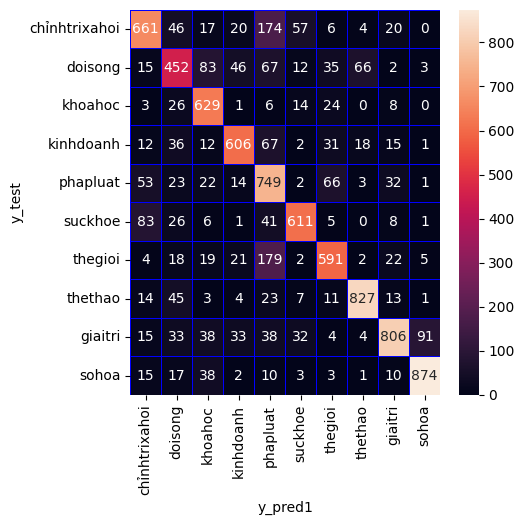

In [40]:
f, ax =plt.subplots(figsize = (5,5))

sns.heatmap(conf_matrix_df,annot = True, linewidths= 0.5, linecolor="blue", fmt=".0f", ax=ax)

plt.xlabel("y_pred1")
plt.ylabel("y_test")
plt.show()

In [41]:
import joblib 

In [42]:
joblib.dump(clf, 'Word2Vec_NeiveBayes.pkl', compress=9)

['Word2Vec_NeiveBayes.pkl']

In [43]:
NB= joblib.load('Word2Vec_NeiveBayes.pkl')

In [44]:
y_pred_2 = NB.predict(X_test)

In [45]:
print("Accuracy:",metrics.accuracy_score(y_test1, y_pred_2))

Accuracy: 0.7628334454158261


svm

In [46]:
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')

svclassifier.fit(X_train, y_train1)

SVC(kernel='linear')

In [47]:
y_pred3 = svclassifier.predict(X_test)

In [48]:
print("Accuracy:",metrics.accuracy_score(y_test1, y_pred3))

Accuracy: 0.895987446760816


In [49]:
cm= confusion_matrix(y_test1, y_pred3)
conf_matrix_df = pd.DataFrame(cm,columns=lang,index=lang)

In [50]:
print(cm)
print(classification_report(y_test1,y_pred3,digits=4))

[[901  15   3   9  37  20   3   7   7   3]
 [ 20 618   9  11  41   7   7  44  16   8]
 [  7  18 667   0   5   2   5   2   3   2]
 [ 10   6   2 741   7   0  15  10   8   1]
 [ 30  45  13   4 803   2  45   3  15   5]
 [ 28   8   1   0   3 732   2   1   6   1]
 [  4  18   5  10  33   0 785   0   3   5]
 [  7  35   2   6  10   1   1 880   4   2]
 [  8  32   8   9   9  11   9   2 918  88]
 [  3   4   1   0   2   0   1   1  12 949]]
               precision    recall  f1-score   support

Chinhtrixahoi     0.8851    0.8965    0.8908      1005
      Doisong     0.7735    0.7913    0.7823       781
      Giaitri     0.9381    0.9381    0.9381       711
      Khoahoc     0.9380    0.9263    0.9321       800
    Kinhdoanh     0.8453    0.8321    0.8386       965
     Phapluat     0.9445    0.9361    0.9403       782
        Sohoa     0.8992    0.9096    0.9044       863
      Suckhoe     0.9263    0.9283    0.9273       948
      Thegioi     0.9254    0.8391    0.8802      1094
      Thethao     

In [51]:
joblib.dump(svclassifier, 'Word2Vec_SVM.pkl', compress=9)

['Word2Vec_SVM.pkl']

In [52]:
SVM= joblib.load('Word2Vec_SVM.pkl')

In [53]:
y_pred_3 = SVM.predict(X_test)

In [54]:
print("Accuracy:",metrics.accuracy_score(y_test1, y_pred_3))

Accuracy: 0.895987446760816


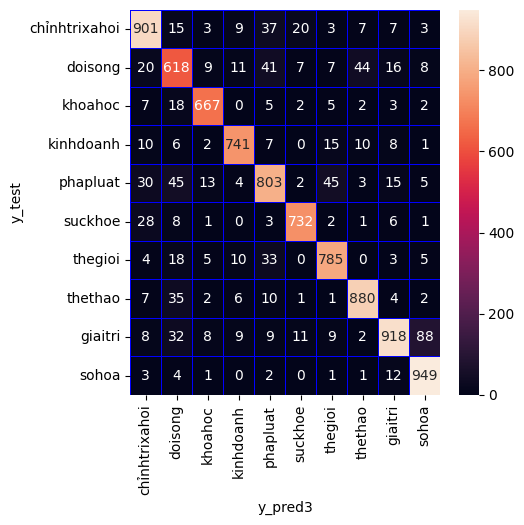

In [55]:
f, ax =plt.subplots(figsize = (5,5))

sns.heatmap(conf_matrix_df,annot = True, linewidths= 0.5, linecolor="blue", fmt=".0f", ax=ax)

plt.xlabel("y_pred3")
plt.ylabel("y_test")
plt.show()

In [56]:
svclassifier = SVC(C=10,kernel='rbf',gamma=0.1)

svclassifier.fit(X_train, y_train1)

SVC(C=10, gamma=0.1)

In [57]:
y_pred_3 = SVM.predict(X_test)